# Practical work on graph-cut optimization (part 2, multilevel)

The objective of this PW is the implementation of the $\alpha$-expansion and $\alpha$-$\beta$ swap approaches for grayscale image denoising.

The PyMaxFlow library is used to compute the graph-cut.

In [41]:
import math
import random
import numpy as np
#%matplotlib notebook
import matplotlib.pyplot as plt

import platform
import tempfile
import os
from scipy import ndimage as ndi
try:
    import maxflow
except:
    !pip install PyMaxflow==1.2.13
    import maxflow

from skimage import io
from bokeh.plotting import figure, output_file, show
from bokeh.plotting import show as showbokeh
from bokeh.io import output_notebook
output_notebook()

def affiche_pour_colab(im,MINI=None, MAXI=None,titre=''): #special colab, don't look
  def normalise_image_pour_bokeh(X,MINI,MAXI):
    if MAXI==None:
      MAXI = np.max(X)
    if MINI==None:
      MINI = np.min(X)
    imt=np.copy(X.copy())
    imt=(np.clip(imt,MINI,MAXI)/(MAXI-MINI))
    imt[imt<0]=0
    imt[imt>1]=1
    imt*=255
    sortie=np.empty((*imt.shape,4),dtype=np.uint8)
    for k in range(3):
      sortie[:,:,k]=imt
    sortie[:,:,3]=255
    return sortie

  img = im
  img=normalise_image_pour_bokeh(np.flipud(im),MINI,MAXI)
  p = figure(tooltips=[("x", "$x"), ("y", "$y"), ("value", "@image")], y_range=[im.shape[0], 0], x_range=[0, im.shape[1]], title=titre)
  # p.x_range.range_padding = p.y_range.range_padding = 0
  # must give a vector of images
  p.image(image=[im], x=0, y=0, dw=im.shape[1], dh=im.shape[0], palette="Greys9", level="image")
  p.xgrid.visible = False
  p.ygrid.visible = False
  showbokeh(p)

def affiche(im,MINI=0.0, MAXI=None,titre='',printname=False):
  affiche_pour_colab(im,MINI=MINI, MAXI=MAXI,titre=titre) # under google colab many options disappear

def display_segmentation_borders(image, bin):
    imagergb = np.copy(image)
    from skimage.morphology import binary_dilation, disk
    contour = binary_dilation(bin,disk(15))^bin
    imagergb[contour==1,0] = 255
    imagergb[contour==1,1] = 0
    imagergb[contour==1,2] = 0
    return imagergb

## 2 Denoising a grayscale image


In this second part of the PW, we are interested in using Markovian methods to **denoise** images with different regularization potentials.

We are interested in denoising the images *Ibruitee.png* and *Ibruitee2.png* which correspond to the same scene perturbed by two noises of different nature.


We will complete programs that call the algorithm of alpha-expansions or Boykov's alpha-beta swap according to the Kolmogorov technique.


Q1: What are the respective expressions for the data attachment potentials in the case of noise following a Gaussian distribution (equation 1) and a Rayleigh distribution (equation 2)?

\begin{equation}
p(y_p|x_p)=\frac{1}{\sqrt{2\pi}\sigma}\exp\left[-\frac{(y_p-x_p)^2}{2\sigma^2}\right],
\end{equation}

\begin{equation}
p(y_p|x_p)=2\frac{y_p}{x_p^2}\exp\left[-\frac{y_p^2}{x_p^2}\right].
\end{equation}

**Your answer &#x270D;**

A1:

Starting form the main forluma seen in the course which is the following :
$D(y_p,x_p) = -\log p(y_p|x_p)$

which is the data attachement term (Potential) so after applying the formula on the probability distribution given above we got the following

for gaussian distibution --------------> $D(y_p,x_p) = c(y_p-x_p)^2 + A$ where A is a constant (assuming that the variance is constant)

for Rayleigh distribustion -------------> $D(y_p,x_p) = B  + \frac{y_p^2}{x_p^2}+ 2\log x_p$ (where B is a constant)

Q2: By studying the histogram of a homogeneous area, indicate which type of noise is present in which image.  



**Your answer &#x270D;**

A2:

Since the Rayleigh distribution is a continuous probability distribution for nonnegative-valued random variables and according to the Histogram seen below we can deduce that the noise in image 1 follows the gaussian distribution whereas in the noise in image 2 follows the Rayleigh distribution

In [42]:
im_obs=io.imread('https://perso.telecom-paristech.fr/tupin/TPGRAPHCUT/OLD/Ibruitee.png') # Observed image, noisy
im_obs2=io.imread('https://perso.telecom-paristech.fr/tupin/TPGRAPHCUT/OLD/Ibruitee2.png') # Observed image, noisy
im_orig=io.imread('https://perso.telecom-paristech.fr/tupin/TPGRAPHCUT/OLD/IoriginaleBW.png') # Reference binary image, to evaluate the quality of the segmentation

I = im_obs
affiche(im_obs,MINI=0.0, MAXI=255.,titre="Noisy image",printname=True)

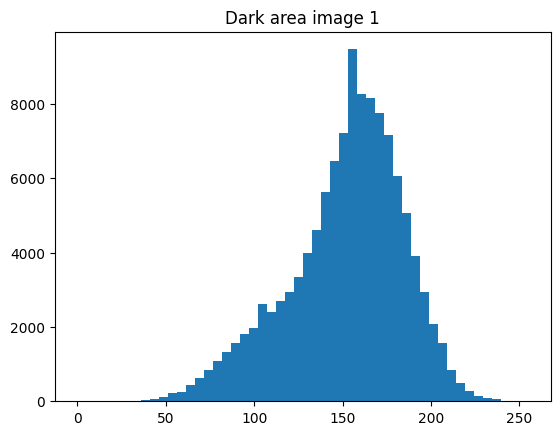

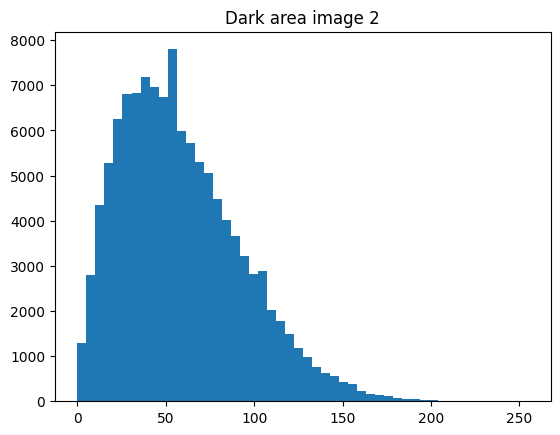

In [43]:
# select a homogeneous area to study the histogram
# we can use the area from 45 to 120 and from 175 to 245
affiche(im_obs[:,:],MINI=0.0, MAXI=255.,titre="Noisy image",printname=True)

plt.figure()
plt.hist(im_obs[:,:].flatten(),50)
plt.title('Dark area image 1')
plt.show()

plt.figure()
plt.hist(im_obs2[:,:].flatten(),50)
plt.title('Dark area image 2')
plt.show()


We will compare three *a priori* models: the Potts model $\delta_{x_p=x_q}$, the (discrete) total variation $|x_p-x_q|$, and the (quadratic) Gaussian model $(x_p-x_q)^2$.

Q3: Are they metrics or semi-metrics? What can we deduce about the optimization method to use?

**Your answer &#x270D;**

A3:

Potts Model: Since it satisfies the triangle inequality so it is indeed a metric ,it is well-suited for α-β swap and α-expansions optimization.


Total Variation: Indeed metric,cause the triangle inequality is also well-satisfied well-suited for α-β swap and α-expansions.


Gaussian Model: since it does not satisfy the triangle inequality so for sure it is semi-metric, based on that so it is only appropriate for α-β swap.

Q4: What are the differences between the alpha expansion method and the alpha-beta swap method?

**Your answer &#x270D;**

A4:

A lot of thing varies between the two methods of graph construction, in the α-β swap technique, a graph is created using only the pixels labeled as either alpha or beta. Conversely, in the α-β approach, the graph includes all pixels.

The strategy for traversing the graph differs. The α-β swap method involves processing pairs of labels, while α-expansion examines all classes.

There's a difference in the constraints applied to the potential regularization energy: the α-β swap employs a semi-metric constraint, whereas the α-expansion uses a metric constraint.

where the constraint are important in order to find a globale minimum and avoid stucking in a local minimum.

In the following sections we will use the functions aexpansion_grid and abswap_grid which perform the alpha-expansion and alpha-beta swap respectively. These functions take as input two arguments for a number of levels L :
- a tensor of the image size containing in the 3rd dimension the data attachment of each pixel for each considered level (unary term)
- a matrix containing the values of the interaction terms between two levels $l_1$ and $l_2$ (depends on the chosen interaction potential)

### 2.1 Denoising in the Gaussian case (synthetic image)

In [44]:
from maxflow.fastmin import aexpansion_grid, abswap_grid

# Loading images
im_obs=io.imread('https://perso.telecom-paristech.fr/tupin/TPGRAPHCUT/OLD/Ibruitee.png').astype('float') # Observed image, noisy
im_obs2=io.imread('https://perso.telecom-paristech.fr/tupin/TPGRAPHCUT/OLD/Ibruitee2.png').astype('float') # Observed image, noisy
im_orig=io.imread('https://perso.telecom-paristech.fr/tupin/TPGRAPHCUT/OLD/IoriginaleBW.png').astype('float') # Reference binary image, to evaluate the quality of the segmentation

I = im_obs

I = I*255/I.max()
L = 30
# Generates L gray levels for nearsest prototype labeling
levs = np.arange(0, 255, 255/L)
# Calculate data cost as the absolute difference between the label prototype and the pixel value
D = np.double(np.abs((I.reshape(I.shape+(1,)) - levs.reshape((1,1,-1)))**2))

affiche(I,MINI=0.0, MAXI=255.,titre="Noisy image",printname=True)

# Generate nearest prototype labeling
Id = np.argmin(D,2)
affiche(Id*255/L,MINI=0.0, MAXI=255.,titre="Maximum likelihood denoising",printname=True)
print(D.shape)
print(D)


Output hidden; open in https://colab.research.google.com to view.

Q5: Here, what does the array D correspond to? Explain its dimension.

**Your answer &#x270D;**

A5:

The array D holds the data attachment for each pixel, corresponding to the size of the image which is 323 by 361. Additionally, it accounts for every level, with a total of L equaling 30

Complete the programs below, and test each regularization model by determining an appropriate beta value each time.

In [45]:
# Potts model regularization
# beta values of several hundred
beta_Potts =2100
# definition of the regularization matrix V(i,j) for the Potts model
V_Potts = np.double(beta_Potts*(np.abs( levs.reshape((-1,1)) - levs.reshape((1,-1)))>0))
affiche(V_Potts)

# Performs the alpha-expansion based on the data attachment D and the regularization V
labels_Potts = aexpansion_grid(D,V_Potts)
affiche(labels_Potts*255/L,MINI=0.0, MAXI=255.0,titre="Graph Cut Denoising, Potts regularization, beta = " + str(beta_Potts),printname=True)

In [46]:
# TV model regularization
# beta value of the order of tens
beta_TV =38
# definition of the regularization matrix V(i,j) for the TV model
V_TV = np.double(beta_TV*(np.abs( levs.reshape((-1,1)) - levs.reshape((1,-1)))))
affiche(V_TV)

# Performs the alpha-expansion based on the data attachment D and the regularization V
labels_TV =aexpansion_grid(D,V_TV)
affiche(labels_TV*255/L,MINI=0.0, MAXI=255.0,titre="Graph Cut Denoising, TV regularization, beta = " + str(beta_TV),printname=True)

In [47]:
# Quadratic model regularization
# beta value of the order of tens
beta_quadratic =5
# definition of the regularization matrix V(i,j) for the quadratic model
V_quadratic =np.double(beta_quadratic*(np.abs( levs.reshape((-1,1)) - levs.reshape((1,-1))))**2)
affiche(V_quadratic)

# Performs the alpha-beta swap based on the data attachment D and the regularization V
labels_Quadratic =aexpansion_grid(D,V_quadratic)
affiche(labels_Quadratic*255/L,MINI=0.0, MAXI=255,titre="Graph Cut Denoising, TV regularization, beta = " + str(beta_quadratic),printname=True)

Q6: Which regularization model do you think is best? Give the best regularization parameter visually found and comment on the results you get in each of the three cases.

**Your answer &#x270D;**

A6:

In the given context of image segmentation, the Potts model proves to be more effective. The ideal parameters for regularization have been identified as 2100, 38, and 5, in that order.

Potts Model: Characterized by its lack of smooth transitions, this model results in clear, distinct segmentation. This is evident in the V_Potts graph, where only the diagonal is zero, indicating sharp segmentation boundaries. The model is known for its quick execution.


VT Model: Offers slightly smoother transitions at the gray level changes around edges, as seen in the V_VT graph. Here, the diagonal is zero but gradually, in a linear manner, approaches 1 away from the diagonal. This model also ensures rapid execution, especially with alpha expansion.


Quadratic Model: Produces very blurred results, attributed to its semi-metric nature ("less costly through intermediaries"). The V_quadratic graph clearly shows this blurring effect in transitions, indicating a softer, less defined segmentation.

### 2.2 Denoising in the case of speckle noise (synthetic image)

Modify the following cells to fit the model for denoising the im_obs2 image.

Q7: Which modifications are needed? (There are several!)

**Your answer &#x270D;**

A7:

We need to modify the data attachment calculation in other word the value of D.

Switching to the Rayleigh model for data attachment.

Adjustments to the grayscale values are also required to avoid division by zero.

Given the changes in the scale of values, it will be mandatory to revise the beta value as well (to make it more precise).

In [48]:
from maxflow.fastmin import aexpansion_grid
from numpy import log

# Loading image
im_obs2=io.imread('https://perso.telecom-paristech.fr/tupin/TPGRAPHCUT/OLD/Ibruitee2.png').astype('float') # Observed image, noisy
I = im_obs2
I = I*255/I.max()
affiche(I,MINI=0.0, MAXI=255.,titre="Noisy image 2",printname=True)

L = 30
# Generates L gray levels for nearsest prototype labeling
levs = np.arange(1/L, 255, 255/L)

# Calculate data cost as the absolute difference between the label prototype and the pixel value
D = -log(2*I.reshape(I.shape+(1,))/levs.reshape((1,1,-1))**2)+(I.reshape(I.shape+(1,))**2/levs.reshape((1,1,-1))**2)
print()
Id = np.argmin(D,2)

# Generate nearest prototype labeling
Id = np.argmin(D,2)
affiche(Id/L*255,MINI=0.0, MAXI=255.,titre="Maximum likelihood denoising",printname=True)

Output hidden; open in https://colab.research.google.com to view.

In [49]:
# beta value in the order of tenths of a unit
beta_Potts =0.5
# definition of the Potts potential matrix
V_Potts =np.double(beta_Potts*(np.abs( levs.reshape((-1,1)) - levs.reshape((1,-1)))>0))

# Performs the alpha-expansion based on the data attachment D and the regularization V
labels_Potts =aexpansion_grid(D,V_Potts)
affiche(labels_Potts*255/L,MINI=0.0, MAXI=255,titre="Graph Cut Denoising, Potts regularization, beta = " + str(beta_Potts),printname=True)

In [50]:
# beta value in hundredths of a unit
beta_TV =0.03
# definition of the regularization matrix for TV
V_TV =np.double(beta_TV*(np.abs( levs.reshape((-1,1)) - levs.reshape((1,-1)))))

# Performs the alpha-expansion based on the data attachment D and the regularization V
labels_TV =aexpansion_grid(D,V_TV)
affiche(labels_TV*255/L,MINI=0.0, MAXI=255,titre="Graph Cut Denoising, TV regularization, beta = " + str(beta_TV),printname=True)

In [51]:
# beta value in the order of thousandths of a unit
beta_quadratic =0.0002
# definition of the regularization matrix for a quadratic potential
V_quadratic =np.double(beta_quadratic*(( levs.reshape((-1,1)) - levs.reshape((1,-1)))**2))

# Performs the alpha-expansion based on the data attachment D and the regularization V
labels_Quadratic =aexpansion_grid(D,V_quadratic)
affiche(labels_Quadratic*255/L,MINI=0.0, MAXI=255.,titre="Graph Cut Denoising, Quadratic regularization, beta = " + str(beta_quadratic),printname=True)

### 2.3 Denoising a natural image

Apply one of the methods used above to denoise the noisy cameraman image. Justify your choice.

Q8: Comment on the result obtained.

**Your answer &#x270D;**

A8:

We are going to use the total variation method. This is because the Potts model, which was good for simple black and white or cartoon images, doesn't work well for real photographs. Also, the quadratic model makes things too blurry because it's a semi-metric, and it takes a long time with alpha-beta swap if there are many shades of gray.

253


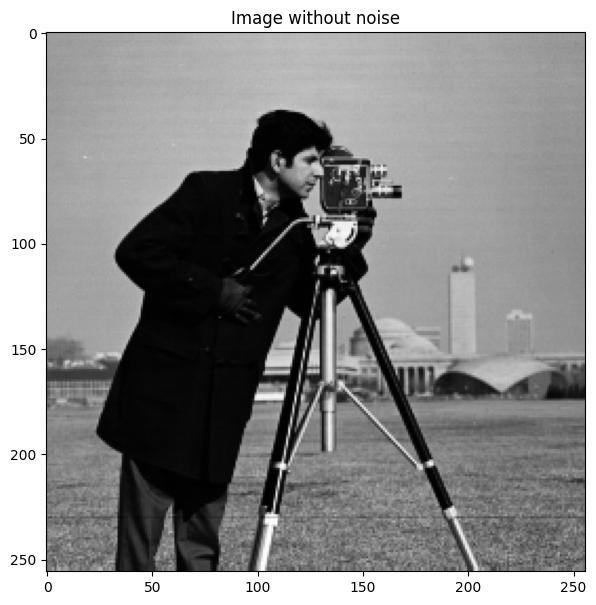

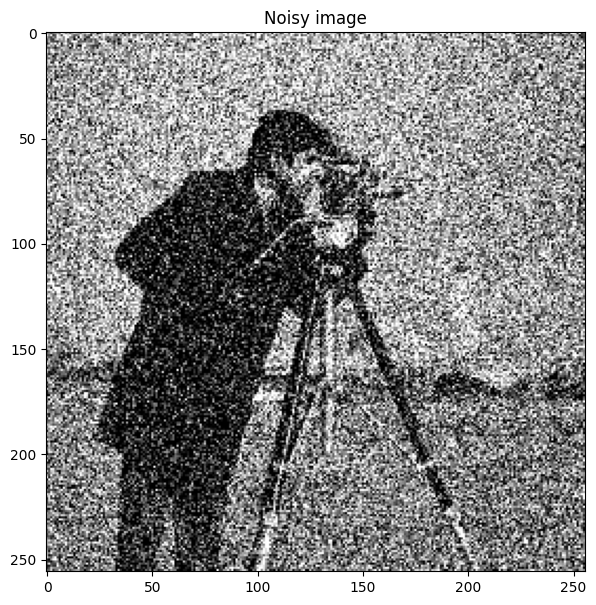

In [52]:
from skimage.color import rgb2gray
import imageio.v2 as imageio

I_cameraman = imageio.imread('https://people.math.sc.edu/Burkardt/data/tif/cameraman.tif')
I_cameraman_bruit = I_cameraman + np.random.normal(0,80,I_cameraman.shape)
I_cameraman_bruit[I_cameraman_bruit<0] = 0
I_cameraman_bruit[I_cameraman_bruit>255] = 255
print(I_cameraman.max())

plt.figure(figsize=(7,7))
plt.imshow(I_cameraman, cmap='gray')
plt.title('Image without noise')
plt.show()

plt.figure(figsize=(7,7))
plt.imshow(I_cameraman_bruit, cmap='gray')
plt.title('Noisy image')
plt.show()

In [53]:
I = 255*I_cameraman_bruit/I.max()
L = 250
# Generates L gray levels for nearsest prototype labeling
levs =np.arange(0,255,255/L)
# Calculate data cost as the absolute difference between the label prototype and the pixel value
D = np.double(np.abs((I.reshape(I.shape+(1,)) - levs.reshape((1,1,-1)))**2))
# choose a regularization model and compute V matrix
beta_TV = 112
V_TV =  np.double(beta_TV*(np.abs( levs.reshape((-1,1)) - levs.reshape((1,-1)))))
labels_TV =  aexpansion_grid(D,V_TV)
# compute the appropriate optimization
labels_TV=aexpansion_grid(D,V_TV)
# display the regularized image
affiche(labels_TV, MINI=0.0,MAXI=None,titre="Denoising by Graph Cut, TV regularization, beta =" + str(beta_TV),printname=True)



### 2.3 SAR Image Denoising

SAR (Synthetic Aperture Radar) imagery is a radar-based remote sensing modality that provides images of the Earth in all light and weather conditions. A major drawback is the high speckle noise that affects them. The following cell loads an amplitude image acquired by the Sentinel 1-A satellite over the city of Des Moines in the USA. To limit the computation time, we will work on a small rectangle from the image provided.

Adapt one of the methods used previously to denoise the image provided. We will assume that the noise follows a Rayleigh distribution.

Q9: Comment on the result obtained.

We can compare the result with a denoising obtained by a more recent method (SAR2SAR), based on a Deep Learning approach (the code to display it is provided below).

**Your answer &#x270D;**

A9:

We got pretty good results using TV with the beta we chose, even with a lot of noise. We got a clearer image, but lost some details of the river's edges. The SAR2SAR method worked much better. Also, we could clean up the whole image from noise as quickly as we did a small part with the alpha expansion.

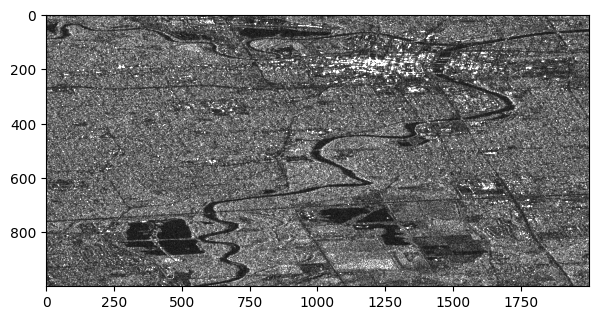

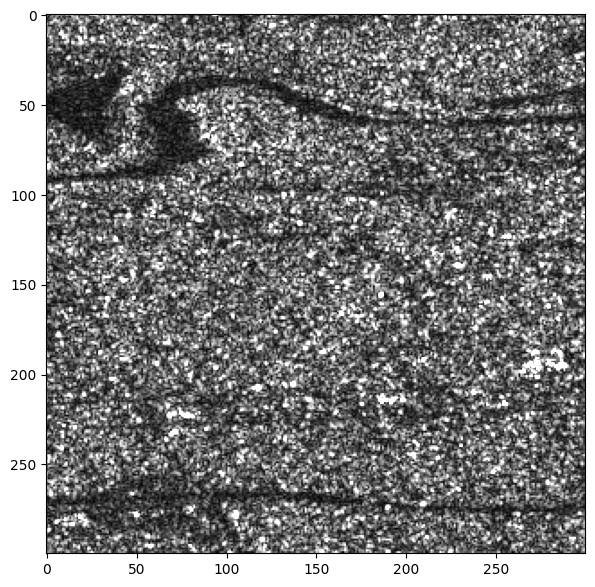

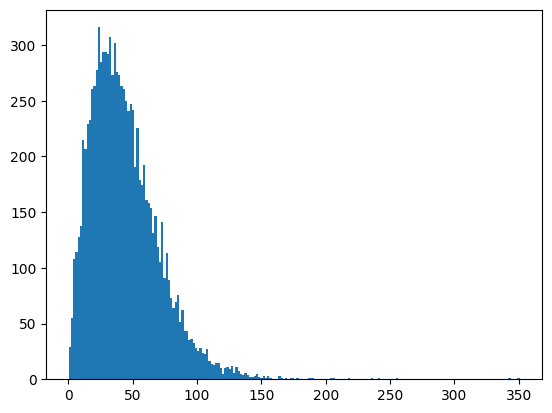

In [54]:
try:
    I_SAR = np.load('noisy_DesMoines_dual_1_corrige_1_VV_AMPLITUDE.npy?dl=1')
except:
    !wget 'https://www.dropbox.com/s/7m2dw3irho8dpzj/noisy_DesMoines_dual_1_corrige_1_VV_AMPLITUDE.npy?dl=1'
    I_SAR = np.load('noisy_DesMoines_dual_1_corrige_1_VV_AMPLITUDE.npy?dl=1')

plt.figure(figsize=(7,7))
plt.imshow(I_SAR,vmax = 100, cmap = 'gray')
plt.show()
I_SAR = I_SAR[0:300,0:300]
plt.figure(figsize=(7,7))
plt.imshow(I_SAR,vmax = 100, cmap = 'gray') # The display is done by truncating the dynamic
plt.show()

plt.figure()
plt.hist(I_SAR[100:200,100:200].flatten(),200) # Display of the histogram on an almost homogeneous area
plt.show()

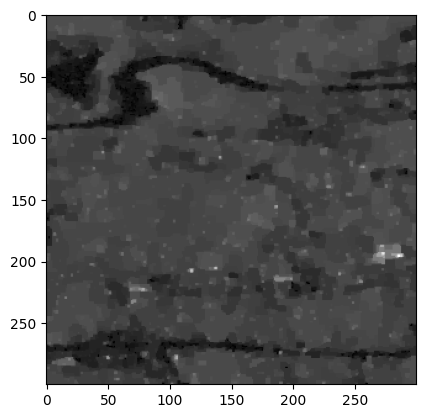

In [55]:
I = I_SAR*255/I_SAR.max()
L = 255
levs = np.arange(1,255,1)
D = -log(2*I.reshape(I.shape+(1,))/levs.reshape((1,1,-1))**2)+(I.reshape(I.shape+(1,))**2/levs.reshape((1,1,-1))**2)

Id= np.argmin(D,2)
affiche(I,MINI=0.0, MAXI=100,titre="Noisy image",printname=True)

beta_TV= 0.13
V_TV = np.double(beta_TV*(np.abs( levs.reshape((-1,1)) - levs.reshape((1,-1)))))

labels_TV=aexpansion_grid(D,V_TV)

affiche(labels_TV, MINI=0.0,MAXI=None,titre="Denoising by Graph Cut, Quadratic regularization, beta =" + str(beta_TV),printname=True)
plt.figure()
plt.imshow(labels_TV,cmap='gray')
plt.show()



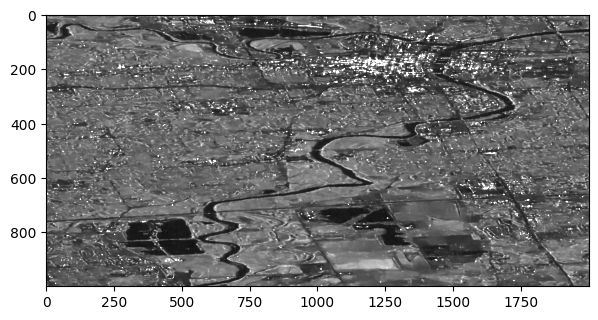

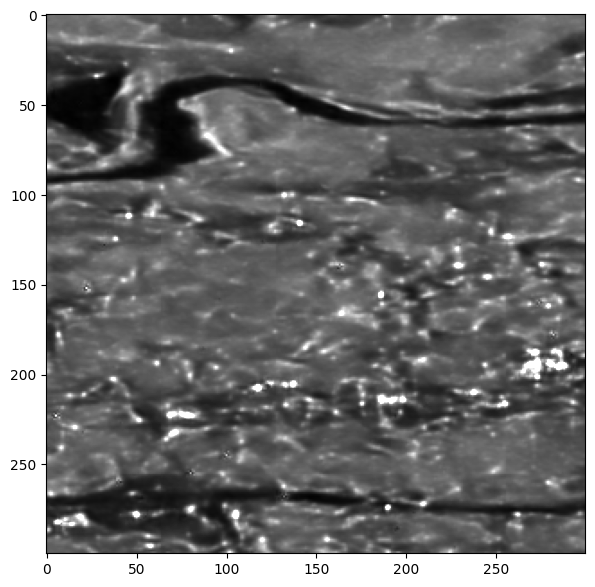

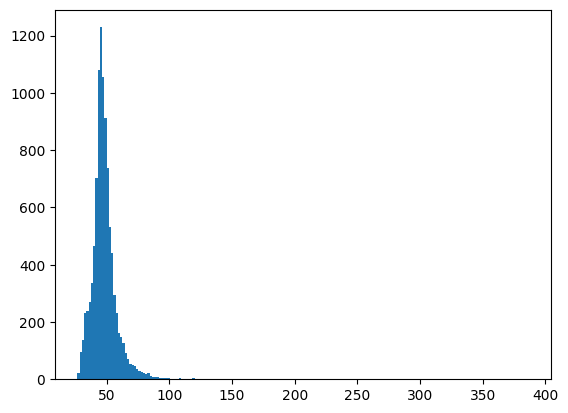

In [56]:
# Display of the denoised image by the SAR2SAR method

try:
    I_SAR = np.load('denoised_DesMoines_dual_1_corrige_1_VV_AMPLITUDE.npy?dl=1')
except:
    !wget 'https://www.dropbox.com/s/0f6l0qr6teck5bd/denoised_DesMoines_dual_1_corrige_1_VV_AMPLITUDE.npy?dl=1'
    I_SAR = np.load('denoised_DesMoines_dual_1_corrige_1_VV_AMPLITUDE.npy?dl=1')

plt.figure(figsize=(7,7))
plt.imshow(I_SAR,vmax = 100, cmap = 'gray')
plt.show()
I_SAR = I_SAR[0:300,0:300]
plt.figure(figsize=(7,7))
plt.imshow(I_SAR,vmax = 100, cmap = 'gray') # The display is done by truncating the dynamic
plt.show()

plt.figure()
plt.hist(I_SAR[100:200,100:200].flatten(),200) # Display of the histogram on an almost homogeneous area
plt.show()